In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from plotnine import *
%matplotlib inline
import calendar
from pandas.api.types import CategoricalDtype
import datetime as dt
import plotly.express as px
import plotly.graph_objects as go
from sklearn import linear_model
import matplotlib as mpl

#https://www.kaggle.com/datasets/theforcecoder/wind-power-forecasting?resource=download

In [2]:
df = pd.read_csv("Data/cleanData.csv", index_col=0)
df['Time'] = pd.to_datetime(df['Time'])

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41915 entries, 33362 to 118223
Data columns (total 17 columns):
 #   Column                        Non-Null Count  Dtype              
---  ------                        --------------  -----              
 0   Time                          41915 non-null  datetime64[ns, UTC]
 1   ActivePower                   41915 non-null  float64            
 2   AmbientTemperatue             41915 non-null  float64            
 3   BearingShaftTemperature       41915 non-null  float64            
 4   Blade1PitchAngle              41915 non-null  float64            
 5   GearboxBearingTemperature     41915 non-null  float64            
 6   GeneratorRPM                  41915 non-null  float64            
 7   GeneratorWinding2Temperature  41915 non-null  float64            
 8   HubTemperature                41915 non-null  float64            
 9   MainBoxTemperature            41915 non-null  float64            
 10  ReactivePower                

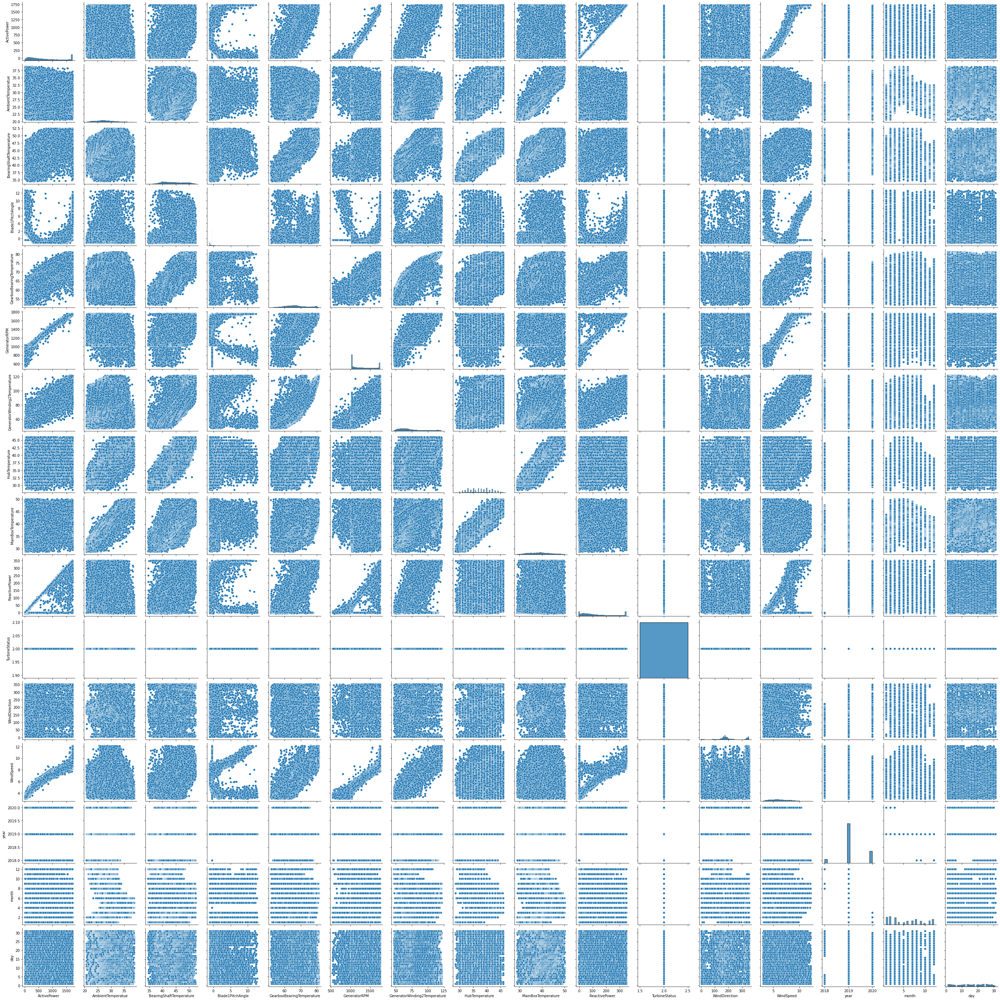

In [4]:
# checking for any relationship between variables 
df_noTime = df.drop("Time", axis=1, inplace=False)
sns.pairplot(df_noTime)

In [5]:
df_daily = df.resample('D', on='Time').mean()
df_daily.reset_index(inplace=True)
df_daily.dropna(inplace=True)

df_daily.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 467 entries, 0 to 589
Data columns (total 17 columns):
 #   Column                        Non-Null Count  Dtype              
---  ------                        --------------  -----              
 0   Time                          467 non-null    datetime64[ns, UTC]
 1   ActivePower                   467 non-null    float64            
 2   AmbientTemperatue             467 non-null    float64            
 3   BearingShaftTemperature       467 non-null    float64            
 4   Blade1PitchAngle              467 non-null    float64            
 5   GearboxBearingTemperature     467 non-null    float64            
 6   GeneratorRPM                  467 non-null    float64            
 7   GeneratorWinding2Temperature  467 non-null    float64            
 8   HubTemperature                467 non-null    float64            
 9   MainBoxTemperature            467 non-null    float64            
 10  ReactivePower                 467 non-

In [6]:
fig = px.line(df_daily, x='Time', y='ActivePower', title="Average Daily Active Power Over Time" )
# fig.update_xaxes(dtick="M1", tickformat="%b")
fig.show()

In [7]:
fig = px.line(df_daily, x='Time', y='WindSpeed', title="Active Power Over Time" )
fig.show()

/usr/lib/python3.10/site-packages/matplotlib/axes/_axes.py:4681: RuntimeWarning:

invalid value encountered in true_divide

/usr/lib/python3.10/site-packages/matplotlib/axes/_axes.py:4681: RuntimeWarning:

invalid value encountered in true_divide

/usr/lib/python3.10/site-packages/matplotlib/axes/_axes.py:4681: RuntimeWarning:

invalid value encountered in true_divide

/usr/lib/python3.10/site-packages/matplotlib/axes/_axes.py:4681: RuntimeWarning:

invalid value encountered in true_divide

/usr/lib/python3.10/site-packages/matplotlib/axes/_axes.py:4681: RuntimeWarning:

invalid value encountered in true_divide

/usr/lib/python3.10/site-packages/matplotlib/axes/_axes.py:4681: RuntimeWarning:

invalid value encountered in true_divide

/usr/lib/python3.10/site-packages/matplotlib/axes/_axes.py:4681: RuntimeWarning:

invalid value encountered in true_divide

/usr/lib/python3.10/site-packages/matplotlib/axes/_axes.py:4681: RuntimeWarning:

invalid value encountered in true_divide

/usr/lib

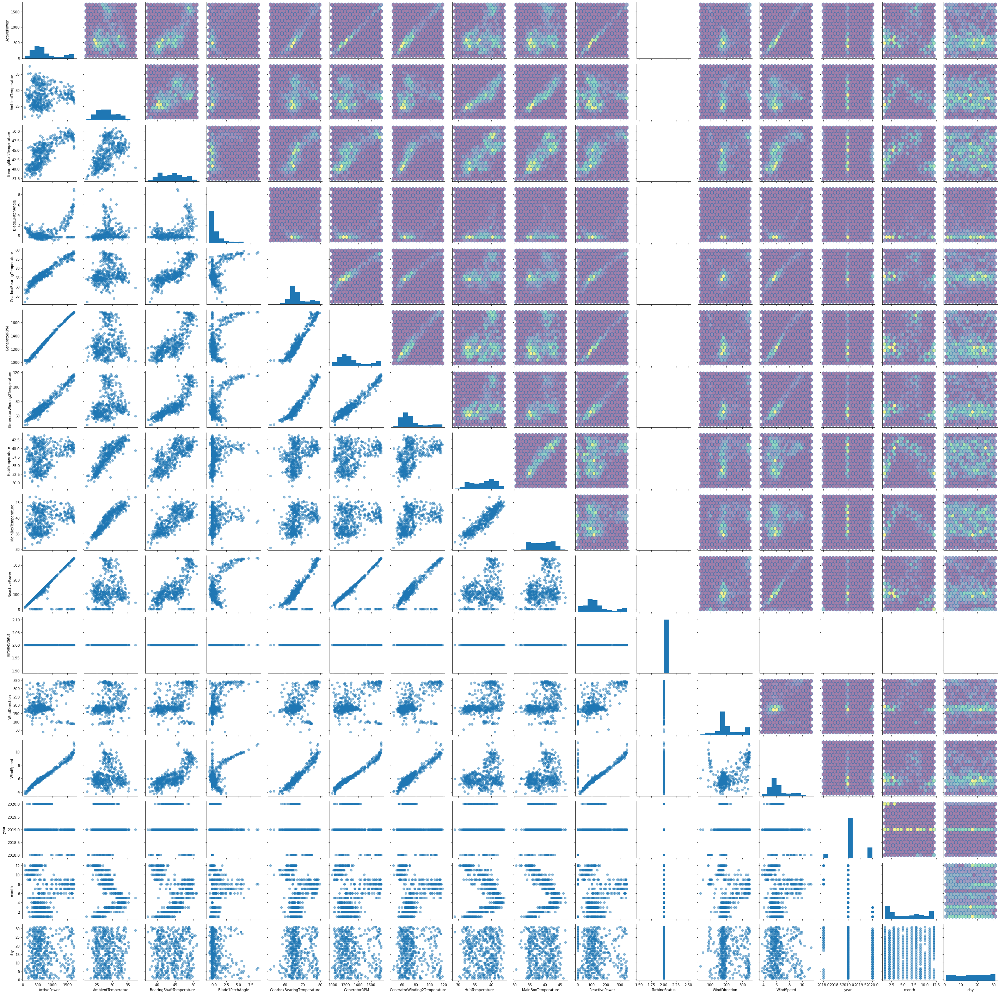

In [8]:
# checking for any relationship between variables 
df_noTime = df_daily.drop("Time", axis=1, inplace=False)
# sns.PairGrid(df_noTime)

def hexbin(x, y, max_series=None, min_series=None, **kwargs):
    cmap = sns.color_palette("viridis", as_cmap=True)
    ax = plt.gca()
    xmin, xmax = min_series[x.name], max_series[x.name]
    ymin, ymax = min_series[y.name], max_series[y.name]
    plt.hexbin(x, y, gridsize=15, cmap=cmap,  extent=[xmin, xmax, ymin, ymax], **kwargs)

g = sns.PairGrid(df_noTime)
g.map_diag(plt.hist)
g.map_lower(plt.scatter, alpha=0.5)
g.map_upper(hexbin, min_series=df_noTime.min(), max_series=df_noTime.max(), alpha=0.5)

In [9]:
# plt.subplots(figsize=(15, 9))
# plt.hexbin(df['WindSpeed'],df['ActivePower'])

# Group by year 2019

In [10]:
df_2019 = df[df['Time'].dt.year == 2019]
df_2019.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29943 entries, 52722 to 105263
Data columns (total 17 columns):
 #   Column                        Non-Null Count  Dtype              
---  ------                        --------------  -----              
 0   Time                          29943 non-null  datetime64[ns, UTC]
 1   ActivePower                   29943 non-null  float64            
 2   AmbientTemperatue             29943 non-null  float64            
 3   BearingShaftTemperature       29943 non-null  float64            
 4   Blade1PitchAngle              29943 non-null  float64            
 5   GearboxBearingTemperature     29943 non-null  float64            
 6   GeneratorRPM                  29943 non-null  float64            
 7   GeneratorWinding2Temperature  29943 non-null  float64            
 8   HubTemperature                29943 non-null  float64            
 9   MainBoxTemperature            29943 non-null  float64            
 10  ReactivePower                

In [11]:
df_daily = df_2019.resample('D', on='Time').mean()
df_daily.reset_index(inplace=True)
df_daily.dropna(inplace=True)

df_daily.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 346 entries, 0 to 364
Data columns (total 17 columns):
 #   Column                        Non-Null Count  Dtype              
---  ------                        --------------  -----              
 0   Time                          346 non-null    datetime64[ns, UTC]
 1   ActivePower                   346 non-null    float64            
 2   AmbientTemperatue             346 non-null    float64            
 3   BearingShaftTemperature       346 non-null    float64            
 4   Blade1PitchAngle              346 non-null    float64            
 5   GearboxBearingTemperature     346 non-null    float64            
 6   GeneratorRPM                  346 non-null    float64            
 7   GeneratorWinding2Temperature  346 non-null    float64            
 8   HubTemperature                346 non-null    float64            
 9   MainBoxTemperature            346 non-null    float64            
 10  ReactivePower                 346 non-

In [12]:
fig = px.line(df_daily, x='Time', y='ActivePower', title="Average Daily Active Power Over Time" )
fig.show()

In [13]:
fig = px.line(df_daily, x='Time', y='WindSpeed', title="Wind Speed Over Time" )
fig.show()

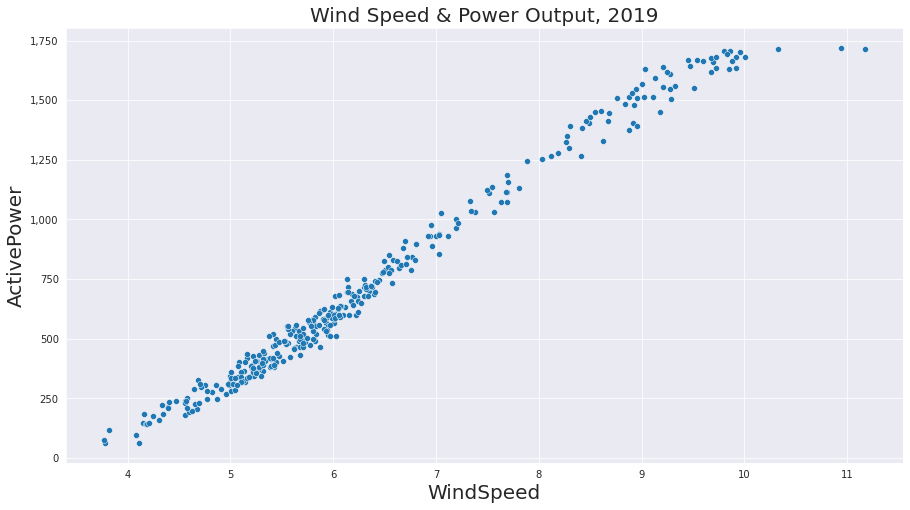

In [14]:
sns.set_style("darkgrid") 
plt.subplots(figsize=(15, 8))
lp=sns.scatterplot(data=df_daily,x ="WindSpeed", y="ActivePower")
lp.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
lp.set_xlabel("WindSpeed",fontsize = 20)
lp.set_ylabel("ActivePower",fontsize = 20)
lp.set_title("Wind Speed & Power Output, 2019",fontsize = 20)

plt.savefig("./Plots/Cor/Speed and Power 2019.png")

# plt.hexbin(df_daily['WindSpeed'],df_daily['ActivePower'])

In [15]:
# sns.set_style("darkgrid") 
# plt.subplots(figsize=(15, 8))
# lp=sns.scatterplot(data=df_daily,x ="WindDirection", y="Blade1PitchAngle")
# # lp=plt.hexbin(df_daily['WindDirection'],df_daily['Blade1PitchAngle'])
# lp.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
# lp.set_xlabel("Wind Direction",fontsize = 20)
# lp.set_ylabel("Blade 1 Pitch Angle",fontsize = 20)
# lp.set_title("Pitch angle response, 2019-",fontsize = 20)


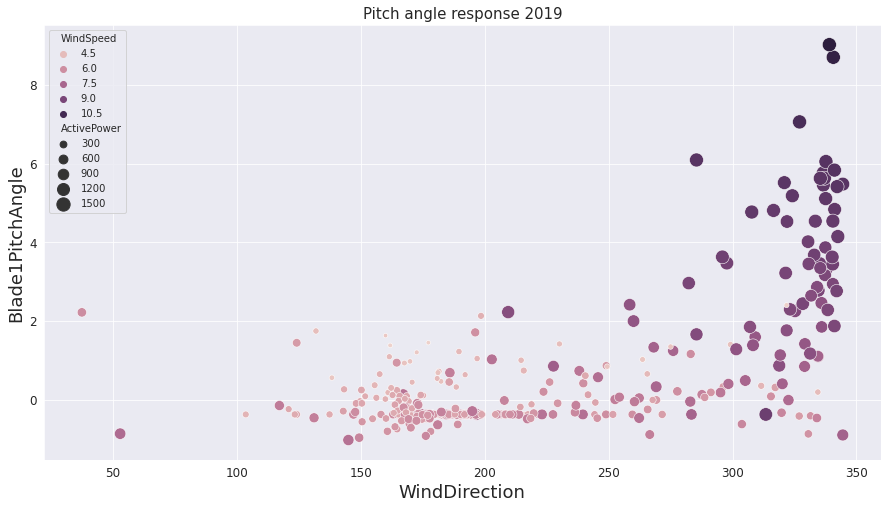

In [16]:
fig, ax = plt.subplots(figsize=(15,8))
sns.scatterplot(data=df_daily, x="WindDirection", y="Blade1PitchAngle", hue='WindSpeed', size="ActivePower", sizes=(20,200), legend=True)
sns.set(font_scale=1)
ax.set_xlabel("WindDirection", fontsize=18)
ax.set_ylabel("Blade1PitchAngle", fontsize=18)
plt.tick_params(axis="y", labelsize=12)
plt.tick_params(axis="x", labelsize=12)
plt.title("Pitch angle response 2019", fontsize=15)
plt.savefig("./Plots/Cor/Pitch angle, direction and power.png")

slope:[2.07864284]
intercept:[-1963.5642771]


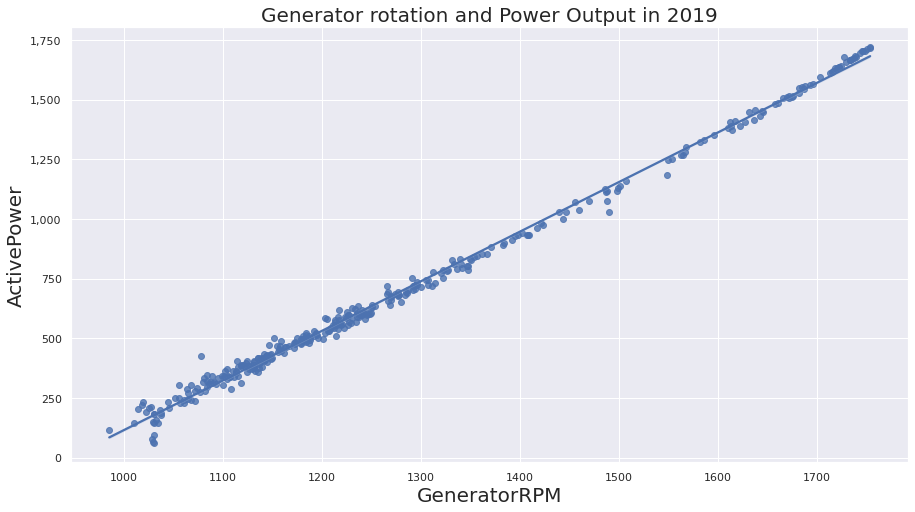

In [17]:
regr = linear_model.LinearRegression()
X = df_daily['GeneratorRPM'].values.reshape(-1,1)
y = df_daily['ActivePower'].values.reshape(-1,1)
regr.fit(X, y)
print("slope:" + str(regr.coef_[0]))
print("intercept:" +str(regr.intercept_))

sns.set_style("darkgrid") 
plt.subplots(figsize=(15, 8))

lp=sns.regplot(data=df_daily, x ="GeneratorRPM", y="ActivePower")
# lp=sns.regplot(data=df_daily, x ="GeneratorRPM", y="ActivePower",fit_reg=True, aspect=1.5,ci=None, scatter_kws={"s": 100})
# props = dict(boxstyle='round', alpha=0.5)
# textstr = '\$y= -1963.85 + 2.08x\$'
# lp.ax.text(0.6, 0.9, textstr, transform=lp.ax.transAxes, fontsize=14, bbox=props)

lp.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
lp.set_xlabel("GeneratorRPM",fontsize = 20)
lp.set_ylabel("ActivePower",fontsize = 20)
lp.set_title("Generator rotation and Power Output in 2019",fontsize = 20)

plt.savefig("./Plots/Cor/Generator rotation and Power Output in 2019.png")

slope:[136.10472619]
intercept:[425.57962407]


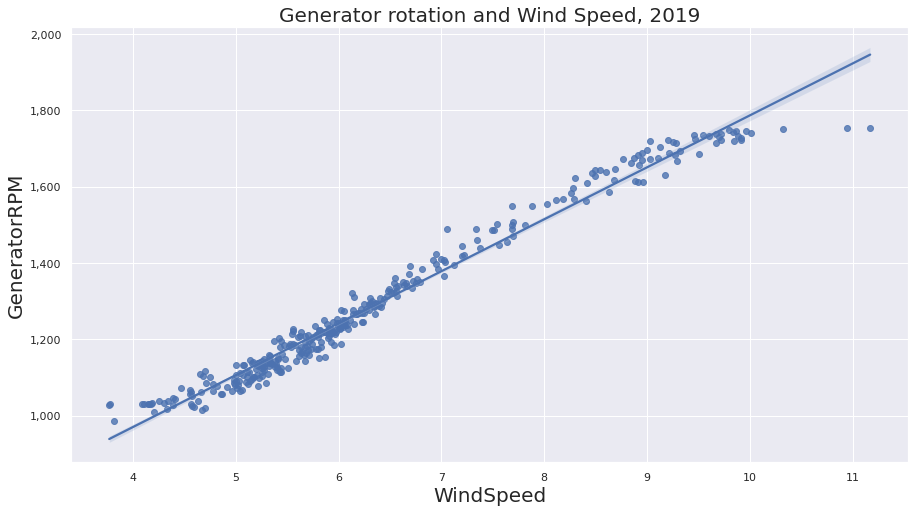

In [18]:
from sklearn import linear_model
regr = linear_model.LinearRegression()
X = df_daily['WindSpeed'].values.reshape(-1,1)
y = df_daily['GeneratorRPM'].values.reshape(-1,1)
regr.fit(X, y)
print("slope:" + str(regr.coef_[0]))
print("intercept:" +str(regr.intercept_))

sns.set_style("darkgrid") 
plt.subplots(figsize=(15, 8))

lp=sns.regplot(data=df_daily, x ="WindSpeed", y="GeneratorRPM")
# lp=sns.regplot(data=df_daily, x ="GeneratorRPM", y="ActivePower",fit_reg=True, aspect=1.5,ci=None, scatter_kws={"s": 100})
# props = dict(boxstyle='round', alpha=0.5)
# textstr = '\$y= -1963.85 + 2.08x\$'
# lp.ax.text(0.6, 0.9, textstr, transform=lp.ax.transAxes, fontsize=14, bbox=props)

lp.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
lp.set_xlabel("WindSpeed",fontsize = 20)
lp.set_ylabel("GeneratorRPM",fontsize = 20)
lp.set_title("Generator rotation and Wind Speed, 2019",fontsize = 20)

plt.savefig("./Plots/Cor/Generator rotation and Wind Speed in 2019.png")

## Correlations between different temperatures and Active power

In [19]:
df_temps = df_daily.drop(['Blade1PitchAngle', 'GeneratorRPM','ReactivePower','TurbineStatus', 'WindDirection', 'WindSpeed', 'year', 'day'], 
                         axis=1, inplace=False)
df_noTime = df_temps.drop("Time", axis=1, inplace=False)


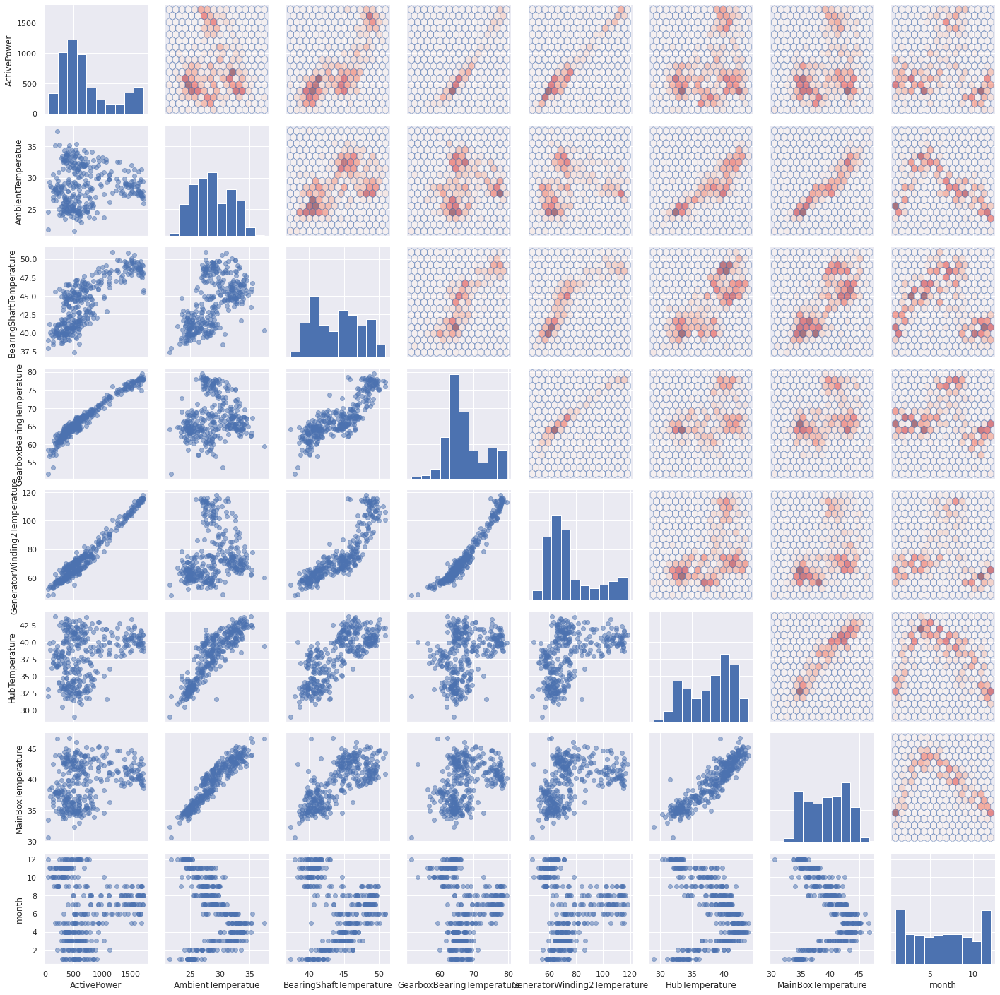

In [20]:

def hexbin(x, y, max_series=None, min_series=None, **kwargs):
    cmap = sns.color_palette("Reds", as_cmap=True)
    ax = plt.gca()
    xmin, xmax = min_series[x.name], max_series[x.name]
    ymin, ymax = min_series[y.name], max_series[y.name]
    plt.hexbin(x, y, gridsize=15, cmap=cmap,  extent=[xmin, xmax, ymin, ymax], **kwargs)

g = sns.PairGrid(df_noTime)
g.map_diag(plt.hist)
g.map_lower(plt.scatter, alpha=0.5)
g.map_upper(hexbin, min_series=df_noTime.min(), max_series=df_noTime.max(), alpha=0.5)

In [21]:
df_temps.columns

Index(['Time', 'ActivePower', 'AmbientTemperatue', 'BearingShaftTemperature',
       'GearboxBearingTemperature', 'GeneratorWinding2Temperature',
       'HubTemperature', 'MainBoxTemperature', 'month'],
      dtype='object')

/tmp/ipykernel_39047/890131145.py:14: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.

/tmp/ipykernel_39047/890131145.py:22: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.

/tmp/ipykernel_39047/890131145.py:30: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.

/tmp/ipykernel_39047/890131145.py:41: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



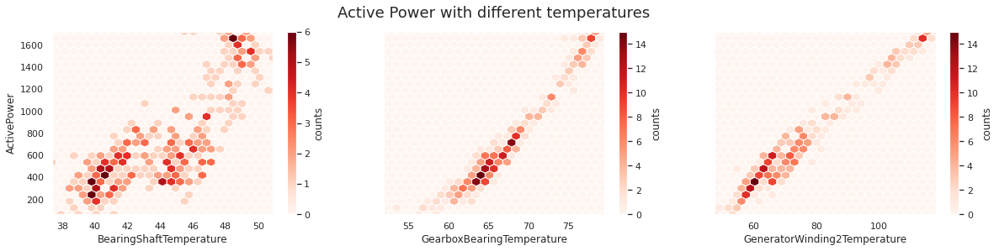

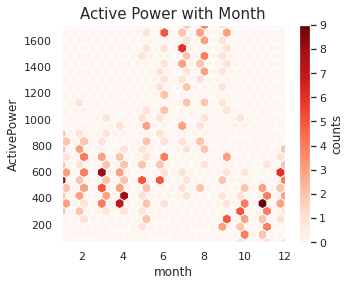

In [22]:
xlim=[]
y = 'ActivePower'
ylim = df_noTime[y].min(), df_noTime[y].max()
cols=['BearingShaftTemperature','GearboxBearingTemperature', 'GeneratorWinding2Temperature', 'month']
for x in cols:
    xlim.append([df_noTime[x].min(),df_noTime[x].max()])

fig, (ax0,ax1,ax2) = plt.subplots(nrows=1, ncols=3, sharey=True, figsize=(20, 4))

#0
im0 = ax0.hexbin(df_noTime[cols[0]],df_noTime['ActivePower'],gridsize=25,
                   cmap=sns.color_palette("Reds", as_cmap=True), edgecolor=None)
ax0.set(xlim=xlim[0], ylim=ylim)
cb = fig.colorbar(im0, ax=ax0, label='counts')
ax0.set_xlabel(cols[0])
ax0.set_ylabel('ActivePower')

#1
im1 = ax1.hexbin(df_noTime[cols[1]],df_noTime['ActivePower'],gridsize=25,
                   cmap=sns.color_palette("Reds", as_cmap=True), edgecolor=None)
ax1.set(xlim=xlim[1], ylim=ylim)
cb = fig.colorbar(im1, ax=ax1, label='counts')
ax1.set_xlabel(cols[1])
# ax1.ylabel('ActivePower')

#3
im2 = ax2.hexbin(df_noTime[cols[2]],df_noTime['ActivePower'],gridsize=25,
                   cmap=sns.color_palette("Reds", as_cmap=True), edgecolor=None)
ax2.set(xlim=xlim[2], ylim=ylim)
cb = fig.colorbar(im2, ax=ax2, label='counts')
ax2.set_xlabel(cols[2])
# ax2.ylabel('ActivePower')
plt.title('Active Power with different temperatures', fontsize=18, x=-1, y=1.05)
plt.savefig('./Plots/Cor/4plots.png')

#4
fig, ax3 = plt.subplots(nrows=1, ncols=1, sharey=True, figsize=(5, 4))
im3 = ax3.hexbin(df_noTime[cols[3]],df_noTime['ActivePower'],gridsize=25,
                   cmap=sns.color_palette("Reds", as_cmap=True), edgecolor=None)
ax3.set(xlim=xlim[3], ylim=ylim)
cb = fig.colorbar(im3, ax=ax3, label='counts')
ax3.set_xlabel(cols[3])
ax3.set_ylabel('ActivePower')
plt.title('Active Power with Month', fontsize=15)
plt.savefig('./Plots/Cor/Power over month.png')

In [23]:
# # plotting line graphs for the number of covid cases and deaths from Jan 2020 to June 2020
# fig = px.line(df[df['Time'].dt.year == 2019], x='Time', y=['ActivePower'], title="Power output over time" )
# # fig.update_xaxes(dtick="M1", tickformat="%b")
# fig.show()

# plt.subplots(figsize=(20, 8))
# sns.lineplot('Time','ActivePower', data=df[df['Time'].dt.year == 2019])

# # plotting line graphs for the number of covid cases and deaths from Jan 2020 to June 2020
# fig = px.line(df[df['Time'].dt.year == 2018], x='Time', y=['ActivePower'], title="Power output over time" )
# # fig.update_xaxes(dtick="M1", tickformat="%b")
# fig.show()

# # checking for any relationship between variables 
# df_noTime = df.drop("Time", axis=1, inplace=False)
# sns.pairplot(df_noTime)

# fig = px.line(df[(df['Time'].dt.year == 2018) & (df['Time'].dt.month == 1)], x='Time', y=['ActivePower'], title="Power output over time" )
# # fig.update_xaxes(dtick="M1", tickformat="%b")
# fig.show()

In [24]:
# pd.set_option('display.max_rows', None)